# Song classifications with LSTM

## Objective
**Attempting to classify EDM from classical piano, using RNN**

## Topics

1. load and visualize audio files with Librosa
2. determine and apply preprocessing
3. build the model??

## Resources

- [Urban Sound Classification, Part 1](https://aqibsaeed.github.io/2016-09-03-urban-sound-classification-part-1/)
- [matplotlib逆引きメモ（フレーム編）](https://qiita.com/cnloni/items/20b5908fbae755192498)

## Data
* EDM Artists: k-391, The Chainsmokers, Avicii, Alan Waler, Kygo, Martin Garrix, Tiesto, Marshmello
* Classical Piano Artists: Yiruma, Chopin, Ludovico Eunaudi, Bethoven

1. Write a script to scrape and download songs from youtube
2. encode with 1/0 for 1 for EDM, 0 for classics, followed by song name

### 1. Load data with Librosa



In [2]:
import IPython.display as ipd
print("Chopin, C Sharp Minor")
ipd.Audio('data/classics/Chopin_c_sharp_minor.mp3')

Chopin, C Sharp Minor


In [3]:
print("Alan Walker - Sing me to sleep")
ipd.Audio('data/edm/Alan_Walker_Sing_Me_To_Sleep.mp3')

Alan Walker - Sing me to sleep


In [4]:
## Now time to load the data using Librosa
import librosa

## Classic
cdata, csampling_rate = librosa.load('data/classics/Chopin_c_sharp_minor.mp3')
edata, esampling_rate = librosa.load('data/edm/Alan_Walker_Sing_Me_To_Sleep.mp3')

`librosa.load(filename)` returns 
- data: numpy array
- sampling_rate: sampling rate, int

**Plotting the Classic first**

In [5]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(12, 4))
plt.title("Chopin C Sharp Minor")
librosa.display.waveplot(cdata, sr=csampling_rate)

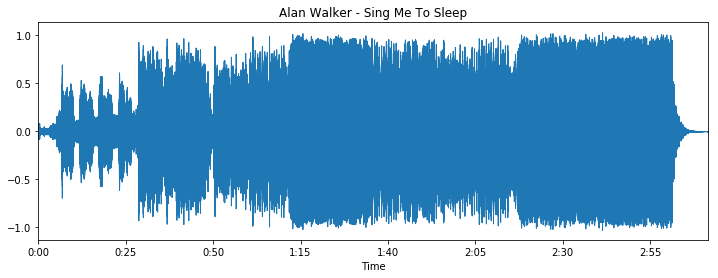

In [6]:
plt.figure(figsize=(12, 4))
plt.title("Alan Walker - Sing Me To Sleep")
librosa.display.waveplot(edata, esampling_rate)

In [43]:
import os
import glob
import numpy as np
# Import all the songs and create a large dataset

which = "edm"
def get_songs(which):
    PATH = os.path.join("data", which)
    files = librosa.util.find_files(PATH)
    songs = []
    song_names = []
    max_len = 0
    for f in files:
         song, sr = librosa.load(f, sr=None)
         if max_len < song.shape[0]: max_len = song.shape[0]
         songs.append(song)
         song_names.append(f.split("/")[-1])
    
    data = np.zeros((len(songs), max_len))
    for i, song in enumerate(songs):
        data[i, :song.shape[0]] = song
    return data, song_names

##### THIS DOES NOT RUN, Kernel keeps dying when used #######
'''
def graph_songs(data, song_names):
    plt.figure(figsize=(25, 60), dpi=900)
    i=1
    for wave, name in zip(data, song_names):
        plt.subplot(10, 1, i)
        librosa.display.waveplot(wave)
        plt.title(name)
        i+=1
    plt.suptitle("Figure 1: Waveplot",x=0.5, y=0.915,fontsize=18)
    plt.show()
'''

## Now graph multiple plots
# fig: outside, the window of the outer fig
# ax: the smaller subplots within the window
# 4 columns, 2 rows of subplots, classics on left and edms on right
# https://qiita.com/cnloni/items/20b5908fbae755192498

def graph_songs(c_songs, c_names, e_songs, e_names):
    # first create the whole plot
    fig = plt.figure(figsize=(20, 14))
    c = 1
    for row in range(1, 5):
        for col in range(1, 3):
            graph_id = 620 + c
            ax = fig.add_subplot(graph_id)
            if col%2==1:
                librosa.display.waveplot(c_songs[row-1])
                ax.set_title(c_names[row-1], fontdict={"size":18})
            elif col%2==0:
                librosa.display.waveplot(e_songs[row-1])
                ax.set_title(e_names[row-1], fontdict={"size":18})
            c+=1
    plt.tight_layout(w_pad=1.0, h_pad=2.0)
    plt.show()


In [ ]:
### Just loading some data ###
classic_songs, classic_names = get_songs('classics')
edm_songs, edm_names = get_songs('edm')

******* Shape of dataset *******
Classic: (6, 17952768)
EDM: (8, 12970415)

 ####### Classic            vs             EDM #######


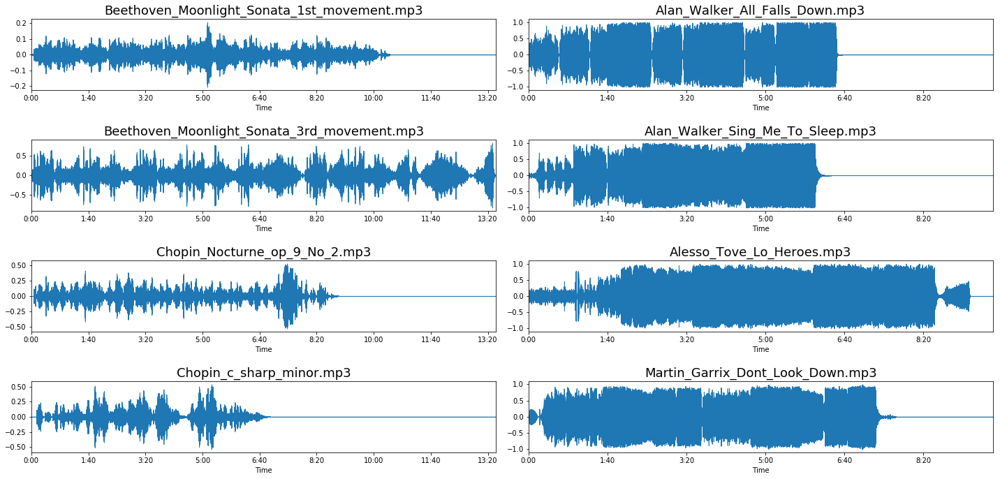

In [41]:
print("*"*7, "Shape of dataset", "*"*7)
print("Classic: {}".format(classic_songs.shape))
print("EDM: {}".format(edm_songs.shape, ))
frame = "#"*7
print("\n {} Classic            vs             EDM {}".format(frame, frame))

graph_songs(classic_songs, classic_names, edm_songs, edm_names)

## 2. Data Preprocessing

### 2.1 What's the data look lile?

* 1D numpy array of value between -1 ~ 1.0, with dimension max 1 x 17952768 
* 

### 2.2 [Data Preparation for Variable Length Input Sequences](https://machinelearningmastery.com/data-preparation-variable-length-input-sequences-sequence-prediction/)

**pre vs post: meaning pre for applying it on the beginning of the sequence, post for ending of the sequence**

#### Sequence Truncation
* cut off specified numbers of time stamps from the sequence in order to alien the length
* use `maxlen=` option to set the sequence length for the processed data

#### Sequence Padding
* add decided value to the sequence of time stamps, to alien the length

**As the link tutorial, we'll use Keras library for preprocessing and prototyping the model**

#### Post Truncating and Plotting the songs

PROCESSED
 classic: (6, 7500000)
 edm: (8, 7500000)


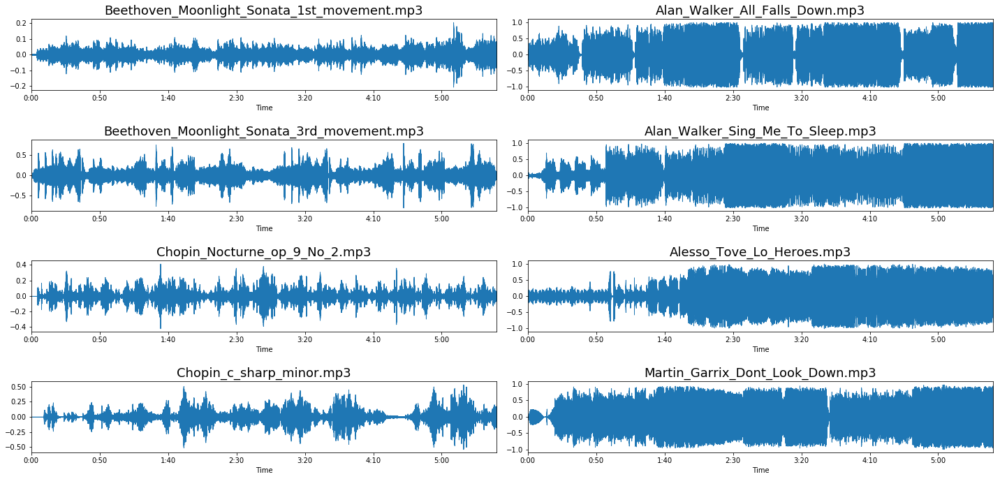

In [42]:
## import keras preprocessing 
from keras_preprocessing.sequence import pad_sequences 
maxlen = int(7.5e+6) 

classic_songs_truncated = pad_sequences(classic_songs, maxlen=maxlen, dtype=np.float64, truncating="post") 
edm_songs_truncated = pad_sequences(edm_songs, maxlen=maxlen, dtype=np.float64, truncating="post") 
print("PROCESSED\n classic: {}\n edm: {}".format(classic_songs_truncated.shape, edm_songs_truncated.shape)) 

# now graph the shorter seqence 
graph_songs(classic_songs_truncated, classic_names, edm_songs_truncated, edm_names)

## 3. Model Construction

Now we have the data in appropriate length, we'll construct an LSTM prototype, and train it.
We'll try single layer LSTM for now.


In [50]:
## Import keras
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Activation
import keras.optimizers as optim

model = Sequential()
model.add(LSTM())
model.add(Dense(1))

# traning
adag = optim.Adagrad(lr=0.01)
model.compile(loss='binary cross_entropy')

TypeError: __init__() missing 1 required positional argument: 'units'